In [5]:
import numpy as np
import skimage as sk
import skimage.io as skio
import matplotlib.pyplot as plt


In [6]:
def l2_distance(img1, img2):
    diff = img1 - img2
    squared = diff ** 2
    return np.sqrt(np.sum(squared))

def ncc_score(img1, img2):
    flat1 = img1.ravel().astype(np.float64)
    flat2 = img2.ravel().astype(np.float64)

    flat1 -= np.mean(flat1)
    flat2 -= np.mean(flat2)

    numer = np.sum(flat1 * flat2)
    denom = np.sqrt(np.sum(flat1 ** 2)) * np.sqrt(np.sum(flat2 ** 2))

    result = numer / denom
    return result

In [7]:
def displacement(img1, img2, displace_vals = [-15, 15], metric = 'ncc'):
    best_score = float('-inf') if metric == 'ncc' else float('inf')
    best_shift = (0,0)
    for dx in range(displace_vals[0], displace_vals[1] + 1):
        for dy in range(displace_vals[0], displace_vals[1] + 1):
            shifted = np.roll(img2, dy, axis = 0)
            shifted = np.roll(shifted, dx, axis = 1)
            if metric != 'ncc':
                diff = l2_distance(img1, shifted)
                if diff < best_score:
                    best_score = diff
                    best_shift = (dx, dy)
            else:
                diff = ncc_score(img1, shifted)
                if diff > best_score:
                    best_score = diff
                    best_shift = (dx, dy)
    return best_shift

In [8]:
def apply_displace(img, dx, dy):
    new = np.roll(img, dy, axis = 0)
    new = np.roll(new, dx, axis = 1)
    return new

In [9]:
def open_file(file, crop):
    im = skio.imread(file)
    # convert to double (might want to do this later on to save memory)    
    im = sk.img_as_float(im)
    height = np.floor(im.shape[0] / 3.0).astype(int)

    b = im[:height]
    g = im[height: 2*height]
    r = im[2*height: 3*height]

    b = b[crop : crop * -1, crop : crop * -1]
    g = g[crop : crop * -1, crop : crop * -1]
    r = r[crop : crop * -1, crop : crop * -1]

    return b,g,r

In [10]:
def basic_colorized(file, crop, displace):
    
    b, g, r = open_file(file, crop)

    colorized_pics = []

    for i in ['l2', 'ncc']:
        bg = displacement(b, g, [displace * -1, displace], i)
        br = displacement(b, r, [displace * -1, displace], i)
    
        shifted_g = apply_displace(g, bg[0], bg[1])
        shifted_r = apply_displace(r, br[0], br[1])
        colorized = np.dstack([shifted_r, shifted_g, b])

        colorized_pics.append(colorized)
    
    return colorized_pics

In [11]:
def displaying(colorized, name):
    plt.imshow(colorized[0])
    plt.title(name + ' L2')
    plt.show()
    plt.imshow(colorized[1])
    plt.title(name + ' NCC')
    plt.show()

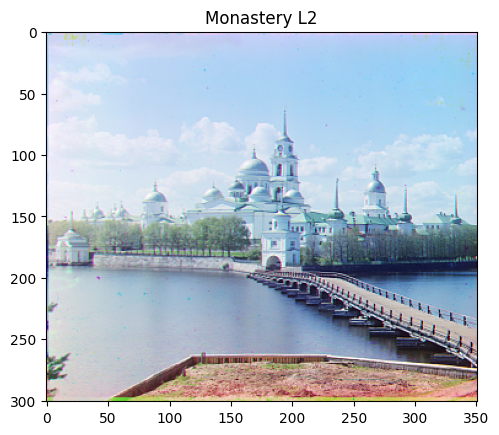

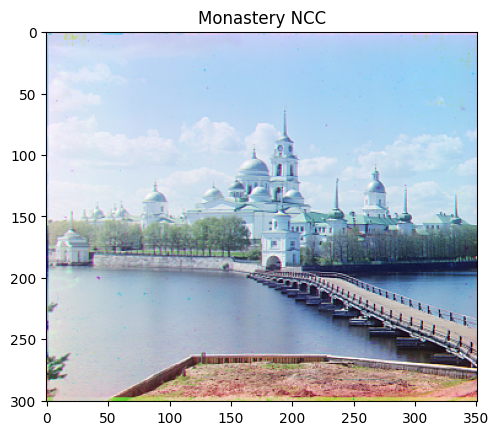

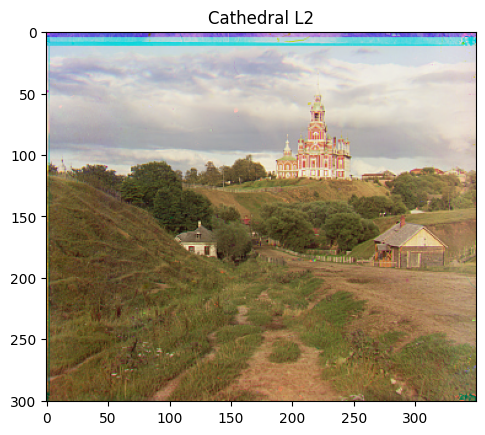

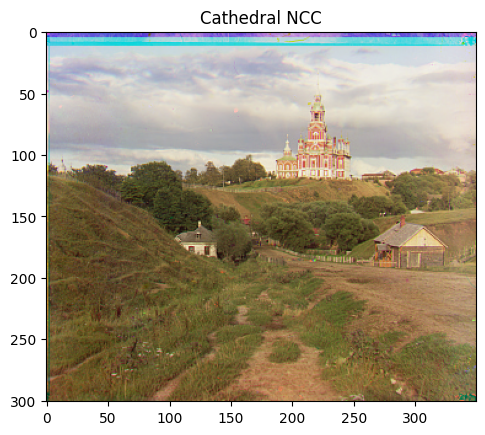

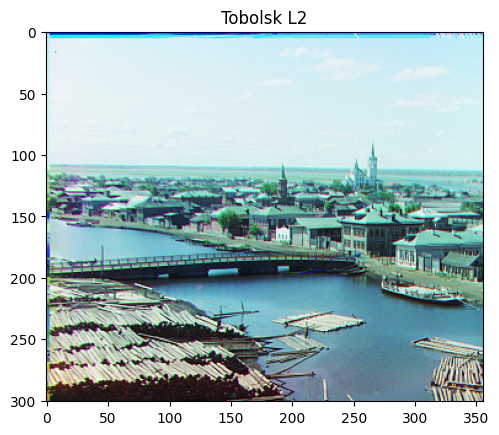

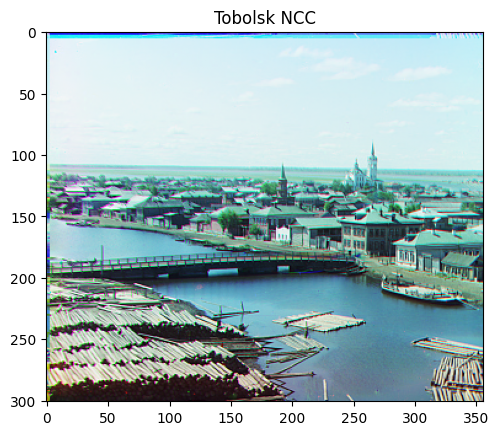

In [12]:
monastery = basic_colorized('./proj_data/monastery.jpg', 20, 15)
displaying(monastery, 'Monastery')

cathedral = basic_colorized('./proj_data/cathedral.jpg', 20, 15)
displaying(cathedral, 'Cathedral')

tobolsk = basic_colorized('./proj_data/tobolsk.jpg', 20, 15)
displaying(tobolsk, 'Tobolsk')

In [13]:
def gaussian_blur(img, x, y):
    # Gaussian weights
    center = 0.25
    adjacent = 0.125
    corners = 0.0625

    total = 0.0

    for dy in range(-1, 2):
        for dx in range(-1, 2):
            try:
                pixel = img[dy + y][dx + x]
            except IndexError:
                continue
            if dy == 0 and dx == 0:
                total += pixel * center
            elif dy == 0 or dx == 0:
                total += pixel * adjacent
            else:
                total += pixel * corners
    return total

In [14]:
def pyramid_down(img, factor = 2):
    H, W = len(img), len(img[0])
    result = [[0 for _ in range(W // factor)] for _ in range(H // factor)]
    
    for y in range(0, H, factor):
        for x in range(0, W, factor):
            try:
                result[y // factor][x // factor] = gaussian_blur(img, x, y)
            except:
                continue

    return np.array(result)

In [15]:
def pyramid_build(img, factor, layers):
    levels = [img]

    while layers != 1:
        levels.append(pyramid_down(levels[-1], factor))
        layers -= 1
    return levels

def pyramid_compare(pyramid1, pyramid2, factor=2):
    shift = (0, 0) 
    
    while len(pyramid1) > 1:
        coarse1, coarse2 = pyramid1[-1], pyramid2[-1]

        # find local shift at this scale
        local_shift = displacement(coarse1, coarse2, [-5, 5], 'ncc')

        # accumulate + scale shift for next level
        shift = (shift[0] * factor + local_shift[0],
                 shift[1] * factor + local_shift[1])

        pyramid2[-2] = apply_displace(pyramid2[-2], shift[0], shift[1])

        pyramid1.pop()
        pyramid2.pop()

    return pyramid2[0], shift



In [16]:
def pyramid_colorized(file, crop, factor, layers):
    b, g, r = open_file(file, crop)

    b_pyramid = pyramid_build(b, factor, layers)
    g_pyramid = pyramid_build(g, factor, layers)
    r_pyramid = pyramid_build(r, factor, layers)

    g_shifted, g_vectors = pyramid_compare(b_pyramid.copy(), g_pyramid, factor)
    r_shifted, r_vectors = pyramid_compare(b_pyramid.copy(), r_pyramid, factor)

    colorized = np.dstack([r_shifted, g_shifted, b])

    return colorized, g_vectors, r_vectors
    

In [17]:
# Configuration parameters
jpg_crop = 20
tif_crop = 200
jpg_layers = 4
tif_layers = 7
factor = 2

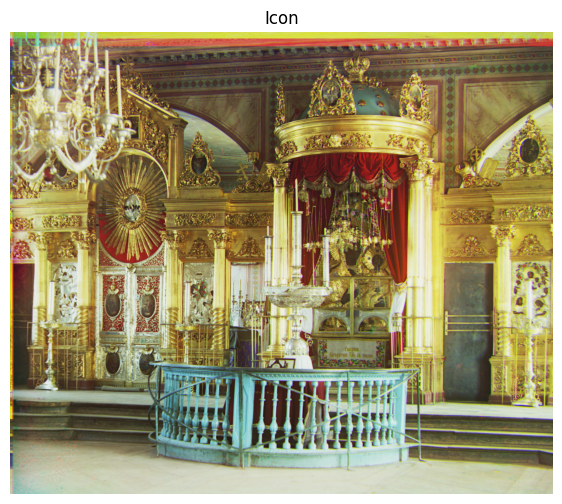

Icon - Green Shifts: (15, 40) Red Shifts: (22, 88)


In [18]:
# Icon
imname = './proj_data/icon.tif'
icon, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(icon)
plt.title('Icon')
plt.axis('off')
plt.show()
print('Icon - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/icon_colorized.jpg', (np.clip(icon, 0, 1) * 255).astype(np.uint8))

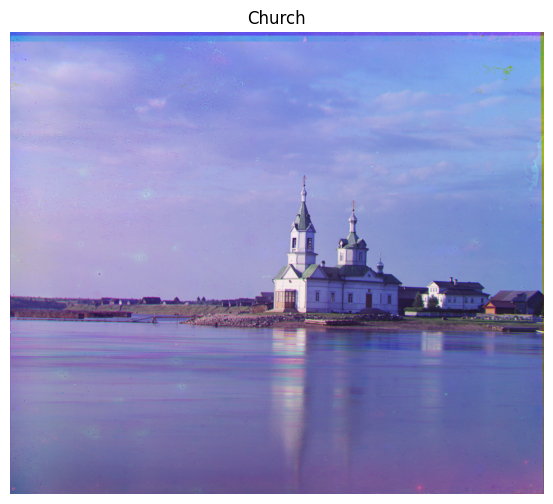

Church - Green Shifts: (4, 22) Red Shifts: (-3, 58)


In [19]:
# Church
imname = './proj_data/church.tif'
church, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(church)
plt.title('Church')
plt.axis('off')
plt.show()
print('Church - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/church_colorized.jpg', (np.clip(church, 0, 1) * 255).astype(np.uint8))

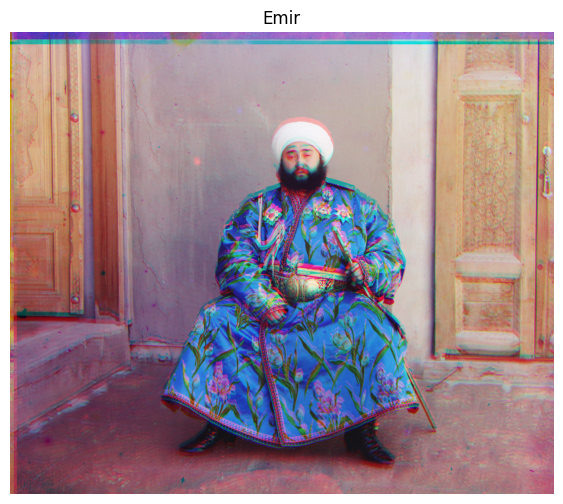

Emir - Green Shifts: (23, 45) Red Shifts: (42, 75)


In [20]:
# Emir
imname = './proj_data/emir.tif'
emir, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, 5)
plt.figure(figsize=(10, 6))
plt.imshow(emir)
plt.title('Emir')
plt.axis('off')
plt.show()
print('Emir - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/emir_colorized.jpg', (np.clip(emir, 0, 1) * 255).astype(np.uint8))

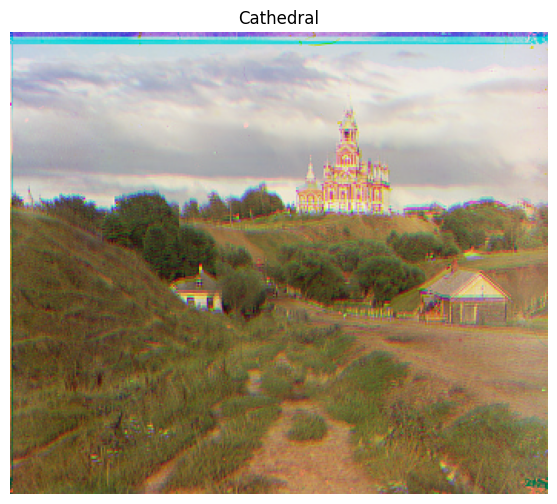

Cathedral - Green Shifts: (1, 3) Red Shifts: (2, 8)


In [21]:
# Cathedral
imname = './proj_data/cathedral.jpg'
cathedral, g_shifts, r_shifts = pyramid_colorized(imname, jpg_crop, factor, jpg_layers)
plt.figure(figsize=(10, 6))
plt.imshow(cathedral)
plt.title('Cathedral')
plt.axis('off')
plt.show()
print('Cathedral - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/cathedral_colorized.jpg', (np.clip(cathedral, 0, 1) * 255).astype(np.uint8))


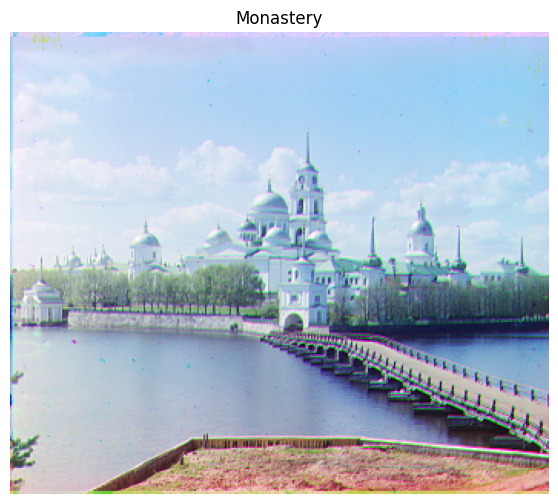

Monastery - Green Shifts: (1, -2) Red Shifts: (2, 3)


In [22]:
# Monastery
imname = './proj_data/monastery.jpg'
monastery, g_shifts, r_shifts = pyramid_colorized(imname, jpg_crop, factor, jpg_layers)
plt.figure(figsize=(10, 6))
plt.imshow(monastery)
plt.title('Monastery')
plt.axis('off')
plt.show()
print('Monastery - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/monastery_colorized.jpg', (np.clip(monastery, 0, 1) * 255).astype(np.uint8))


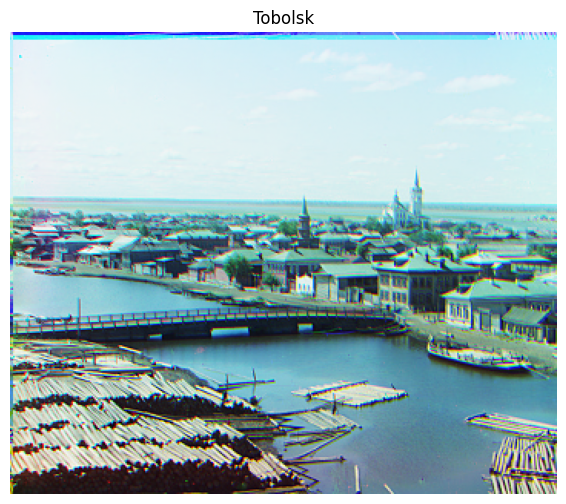

Tobolsk - Green Shifts: (2, 2) Red Shifts: (2, 5)


In [23]:
# Tobolsk
imname = './proj_data/tobolsk.jpg'
tobolsk, g_shifts, r_shifts = pyramid_colorized(imname, jpg_crop, factor, jpg_layers)
plt.figure(figsize=(10, 6))
plt.imshow(tobolsk)
plt.title('Tobolsk')
plt.axis('off')
plt.show()
print('Tobolsk - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/tobolsk_colorized.jpg', (np.clip(tobolsk, 0, 1) * 255).astype(np.uint8))


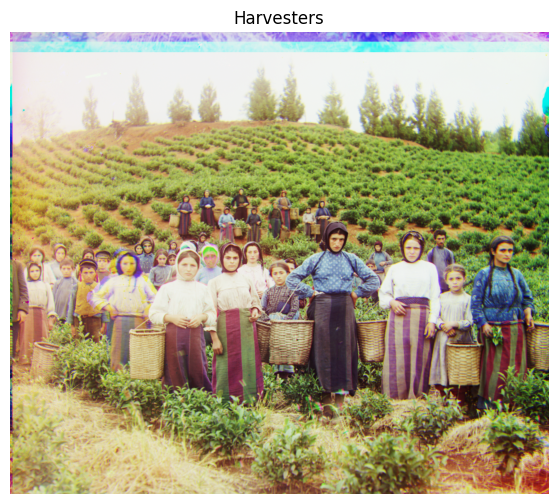

Harvesters - Green Shifts: (16, 59) Red Shifts: (13, 123)


In [24]:
# Harvesters
imname = './proj_data/harvesters.tif'
harvesters, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(harvesters)
plt.title('Harvesters')
plt.axis('off')
plt.show()
print('Harvesters - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/harvesters_colorized.jpg', (np.clip(harvesters, 0, 1) * 255).astype(np.uint8))


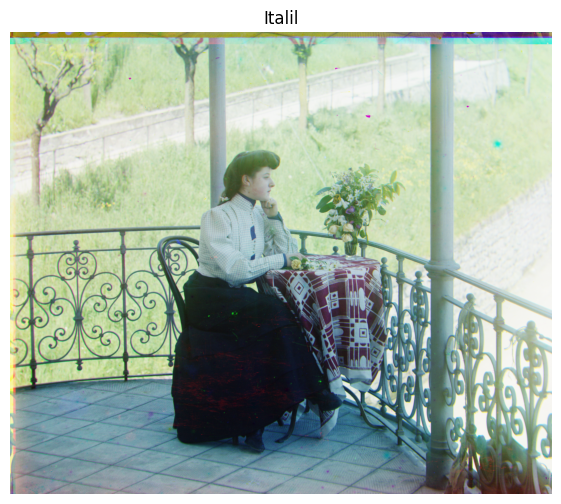

Italil - Green Shifts: (20, 36) Red Shifts: (34, 75)


In [25]:
# Italil
imname = './proj_data/italil.tif'
italil, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(italil)
plt.title('Italil')
plt.axis('off')
plt.show()
print('Italil - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/italil_colorized.jpg', (np.clip(italil, 0, 1) * 255).astype(np.uint8))


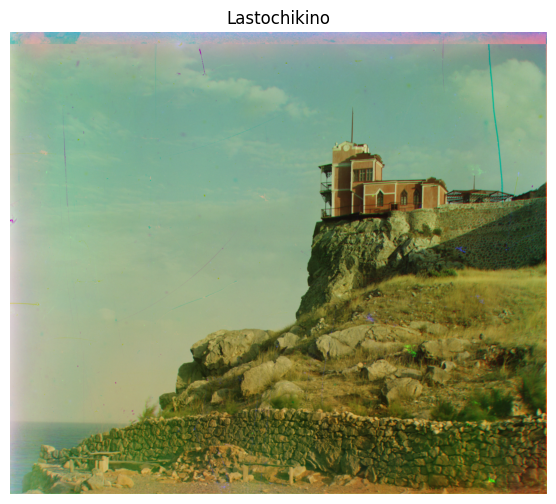

Lastochikino - Green Shifts: (-1, -2) Red Shifts: (-7, 74)


In [26]:
# Lastochikino
imname = './proj_data/lastochikino.tif'
lastochikino, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(lastochikino)
plt.title('Lastochikino')
plt.axis('off')
plt.show()
print('Lastochikino - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/lastochikino_colorized.jpg', (np.clip(lastochikino, 0, 1) * 255).astype(np.uint8))


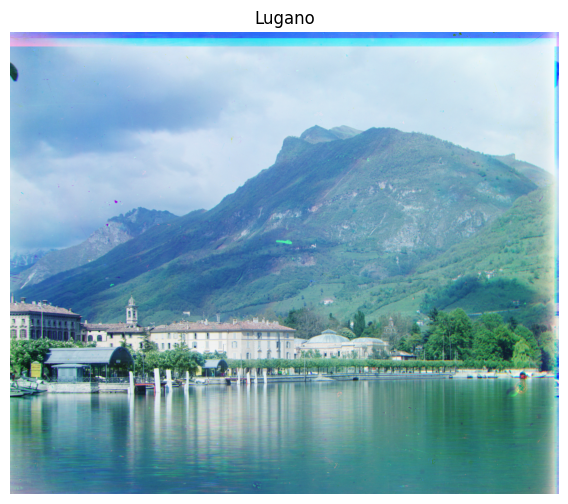

Lugano - Green Shifts: (-15, 38) Red Shifts: (-28, 89)


In [27]:
# Lugano
imname = './proj_data/lugano.tif'
lugano, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(lugano)
plt.title('Lugano')
plt.axis('off')
plt.show()
print('Lugano - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/lugano_colorized.jpg', (np.clip(lugano, 0, 1) * 255).astype(np.uint8))


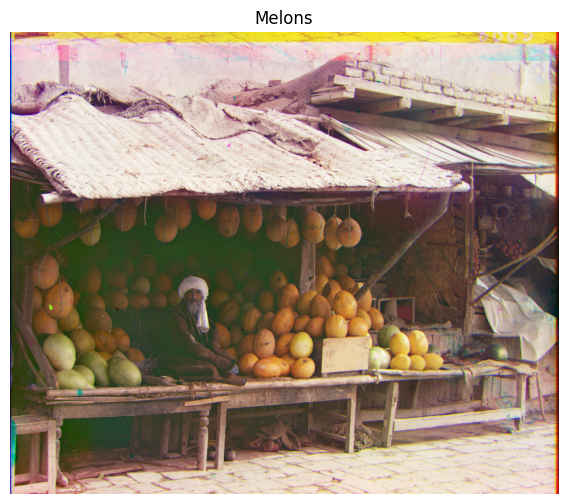

Melons - Green Shifts: (7, 81) Red Shifts: (11, 176)


In [28]:
# Melons
imname = './proj_data/melons.tif'
melons, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(melons)
plt.title('Melons')
plt.axis('off')
plt.show()
print('Melons - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/melons_colorized.jpg', (np.clip(melons, 0, 1) * 255).astype(np.uint8))


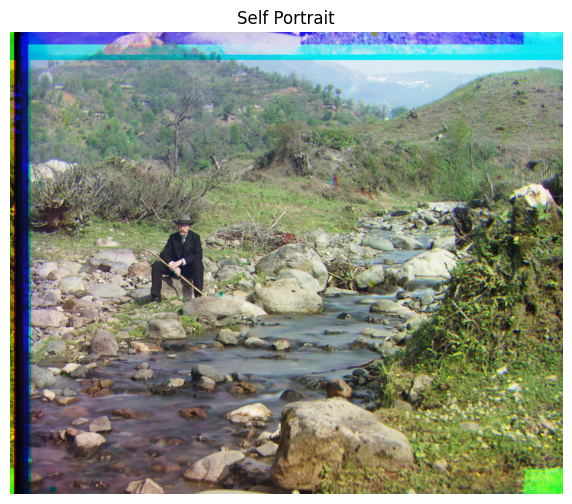

Self Portrait - Green Shifts: (25, 77) Red Shifts: (34, 173)


In [29]:
# Self Portrait
imname = './proj_data/self_portrait.tif'
self_portrait, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(self_portrait)
plt.title('Self Portrait')
plt.axis('off')
plt.show()
print('Self Portrait - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/self_portrait_colorized.jpg', (np.clip(self_portrait, 0, 1) * 255).astype(np.uint8))


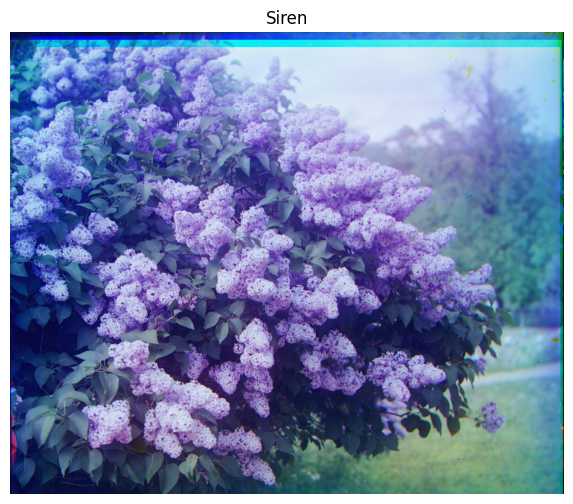

Siren - Green Shifts: (-6, 48) Red Shifts: (-24, 93)


In [30]:
# Siren
imname = './proj_data/siren.tif'
siren, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(siren)
plt.title('Siren')
plt.axis('off')
plt.show()
print('Siren - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/siren_colorized.jpg', (np.clip(siren, 0, 1) * 255).astype(np.uint8))


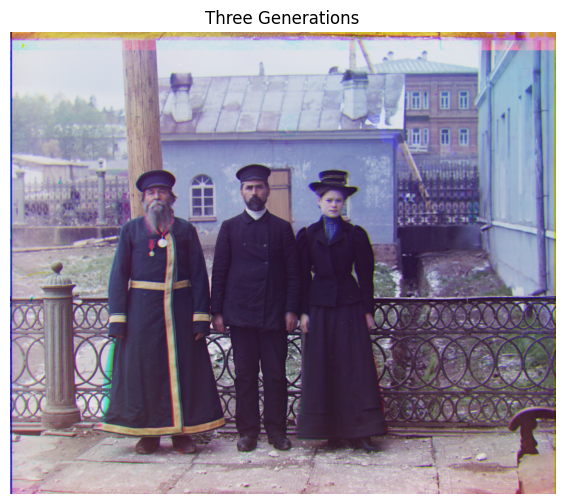

Three Generations - Green Shifts: (13, 51) Red Shifts: (10, 111)


In [31]:
# Three Generations
imname = './proj_data/three_generations.tif'
three_generations, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(three_generations)
plt.title('Three Generations')
plt.axis('off')
plt.show()
print('Three Generations - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/three_generations_colorized.jpg', (np.clip(three_generations, 0, 1) * 255).astype(np.uint8))


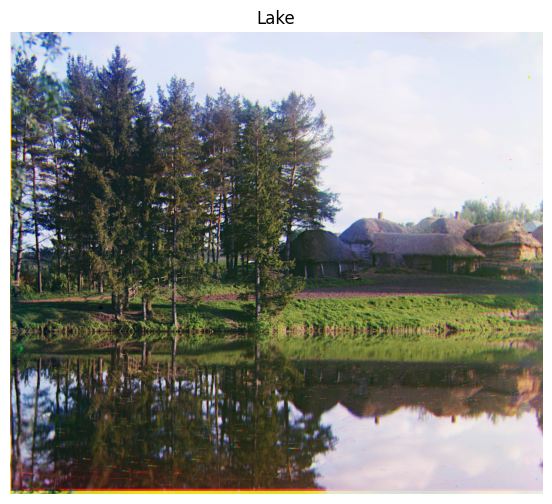

Lake - Green Shifts: (7, -19) Red Shifts: (9, -32)


In [32]:
# Lake
imname = './proj_data/lake.tif'
lake, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(lake)
plt.title('Lake')
plt.axis('off')
plt.show()
print('Lake - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/lake_colorized.jpg', (np.clip(lake, 0, 1) * 255).astype(np.uint8))


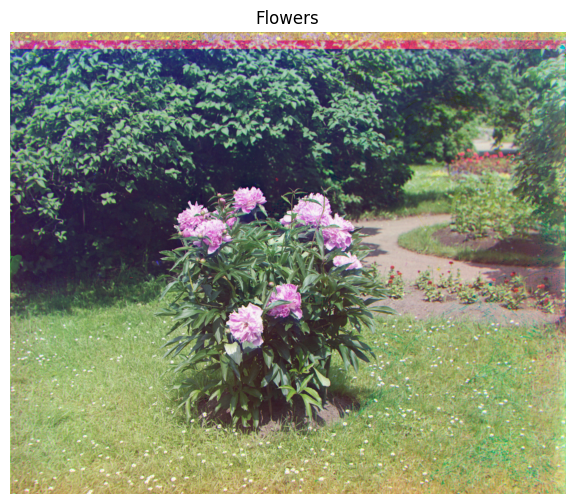

Flowers - Green Shifts: (3, 51) Red Shifts: (-5, 103)


In [33]:
# Flowers
imname = './proj_data/flowers.tif'
flowers, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(flowers)
plt.title('Flowers')
plt.axis('off')
plt.show()
print('Flowers - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/flowers_colorized.jpg', (np.clip(flowers, 0, 1) * 255).astype(np.uint8))


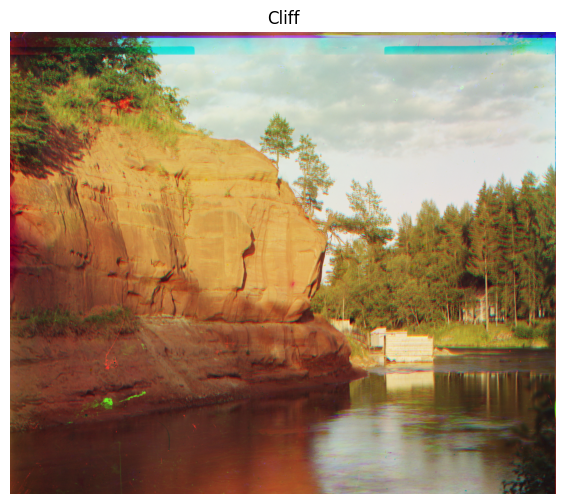

Cliff - Green Shifts: (-1, 36) Red Shifts: (-6, 139)


In [34]:
# Cliff
imname = './proj_data/cliff.tif'
cliff, g_shifts, r_shifts = pyramid_colorized(imname, tif_crop, factor, tif_layers)
plt.figure(figsize=(10, 6))
plt.imshow(cliff)
plt.title('Cliff')
plt.axis('off')
plt.show()
print('Cliff - Green Shifts:', g_shifts, 'Red Shifts:', r_shifts)
skio.imsave('colorized_pics/cliff_colorized.jpg', (np.clip(cliff, 0, 1) * 255).astype(np.uint8))
